In [1]:
using Distributions
using AlphaStableDistributions
using Statistics
using Plots
using StatsPlots
using StatsFuns
using Measures

import ColorSchemes.viridis

In [2]:
parent_folder = dirname(dirname(pwd()))
source_path = parent_folder * "\\src\\julia"

include("$source_path/01_priors.jl")
include("$source_path/02_diffusion.jl")
include("$source_path/03_experiment.jl")
include("$source_path/04_datasets.jl")

generate_levy_batch

Parameters

•	a = threshold separation; 

•	zr = relative starting point;

•	v0 = drift rate for blue stimuli or non-word stimuli;

•	v1 = drift rate for orange stimuli or word stimuli; 

•	t0 = non-decisional time; 

•	alpha = stability parameter of noise distribution; 

•	sz = across-trial variability in starting point; 

•	sv = across-trial variability in drift rate;

•	st = across-trial variability in non-decisional processes 



Other Stuff

•	dt = granularity of time steps

•	tol = maximum number of time steps

•	rho = scaling factor

•	beta = skewness of the levy distribution (always 0 in our use case?)

# Prior predictive & pushforward checks

## RTs & Accuracies

In [3]:
# Simulate data
batch_size = 100
n_clusters = 40
n_trials = 900

m1_batch_indices, m1_batch_data = generate_levy_batch(1, batch_size, n_clusters, n_trials);
m2_batch_indices, m2_batch_data = generate_levy_batch(2, batch_size, n_clusters, n_trials);
m3_batch_indices, m3_batch_data = generate_levy_batch(3, batch_size, n_clusters, n_trials);
m4_batch_indices, m4_batch_data = generate_levy_batch(4, batch_size, n_clusters, n_trials);

model_batches = [m1_batch_data, m2_batch_data, m3_batch_data, m4_batch_data];

In [ ]:
# Plot mean subject reaction times by model
plot_labels = ["Basic Diffusion Model" "Basic Lévy Flight Model" "Full Diffusion Model" "Full Lévy Flight Model"]

subject_rt_means = plot(title="Mean subject RTs by model")
    for (i,m) in enumerate(model_batches)
        label=plot_labels[1,i]
        density!(mean(m[:, :, :, 2], dims=(1,3))[1,:,1], labels=label, color=get(viridis, [0, 0.3, 0.6, 0.9])[i])
    end
display(subject_rt_means)

In [ ]:
# Plot subject accuracies by model
plot_labels = ["Basic Diffusion Model" "Basic Lévy Flight Model" "Full Diffusion Model" "Full Lévy Flight Model"]

subject_accs = plot(title="Mean subject accuracies by model")
    for (i, m) in enumerate(model_batches)
        label=plot_labels[1,i]
        subject_accuracy = fill(0.0, n_clusters)
        for k in 1:n_clusters
            subject_accuracy[k] = sum(m[:, k, :, 1] .== m[:, k, :, 3])/length(m[:, k, :, 1])
        end
        density!(subject_accuracy, labels=label, color=get(viridis, [0, 0.3, 0.6, 0.9])[i])
    end
display(subject_accs)

In [ ]:
# RTs for correct vs incorrect trials

correct_trials = Any[]
incorrect_trials = Any[]

for (i, m) in enumerate(model_batches)
    append!(correct_trials, m[:,:,:,2][m[:, :, :, 1] .== m[:, :, :, 3]])
    append!(incorrect_trials, m[:,:,:,2][m[:, :, :, 1] .!= m[:, :, :, 3]])
end

println("Correct trials       incorrect trials")
println([mean(correct_trials), mean(incorrect_trials)])
println([std(correct_trials), std(incorrect_trials)])

## Hyperpriors

In [3]:
# Plot prior pushforwards
n_sims = 10000
number_params = 12

sim_data = fill(0.0, (n_sims, number_params))

for i in 1:n_sims
    sim_data[i, :] = generate_levy_hyperpriors()
end

sim_data_means = round.(mean(sim_data, dims=1), digits=2)
sim_data_sds = round.(std(sim_data, dims=1), digits=2);

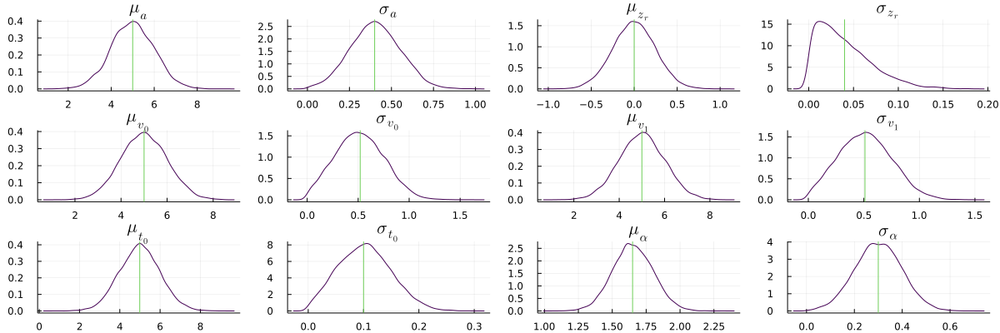

In [4]:
params = ["\$\\mu_a\$" "\$\\sigma_a\$" "\$\\mu_{z_r}\$" "\$\\sigma_{z_r}\$" "\$\\mu_{v_0}\$" "\$\\sigma_{v_0}\$" "\$\\mu_{v_1}\$" "\$\\sigma_{v_1}\$" "\$\\mu_{t_0}\$" "\$\\sigma_{t_0}\$" "\$\\mu_\\alpha\$" "\$\\sigma_\\alpha\$"]
density(sim_data, layout=number_params, size=(1200,400), title=params, legend=false, color=:viridis)
vline!(sim_data_means, layout=number_params, label="", color=viridis[200])

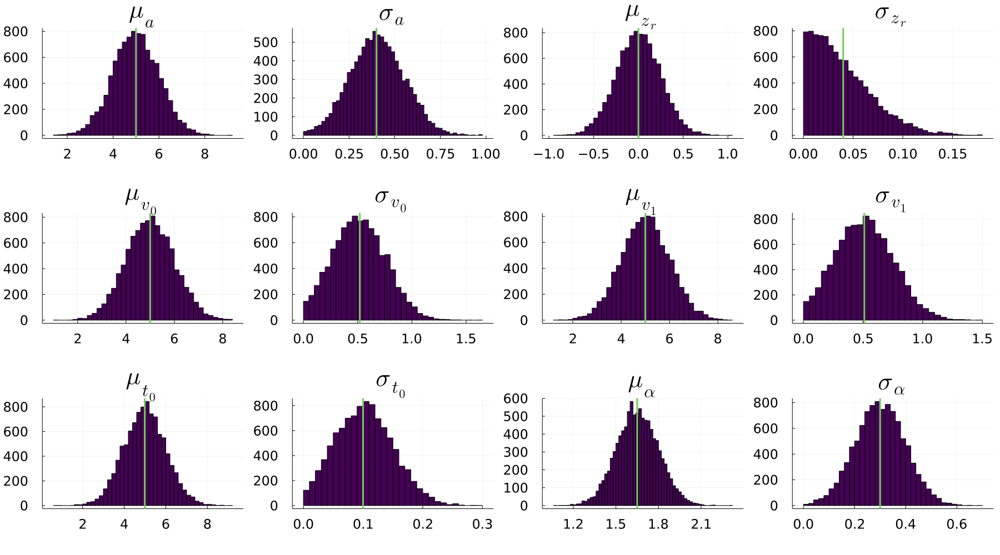

In [5]:
# Alternative: Histograms
histogram(sim_data, layout=number_params, size=(1800,1000), title=params, 
          titlefontsize=30, tickfontsize=16,
          top_margin=3mm, bottom_margin=12mm, legend=false, color=:viridis)
vline!(sim_data_means, layout=number_params, label="", color=viridis[200], linewidth=3)

In [6]:
savefig("pp_hyperpriors.pdf")

## Group-level priors

### Hierarchical group-level priors

#### Marginal distribution (hyperpriors integrated out)

In [7]:
# Simulate multiple datasets
n_sims_datasets = 10000
number_params = 9

sim_data = fill(0.0, (n_sims_datasets, number_params))

for d in 1:n_sims_datasets
    hyperpriors = generate_levy_hyperpriors()
    sim_data[d, :] = generate_levy_priors(hyperpriors...)
end

sim_data_means = mean(sim_data, dims=1)
sim_data_sds = std(sim_data, dims=1);

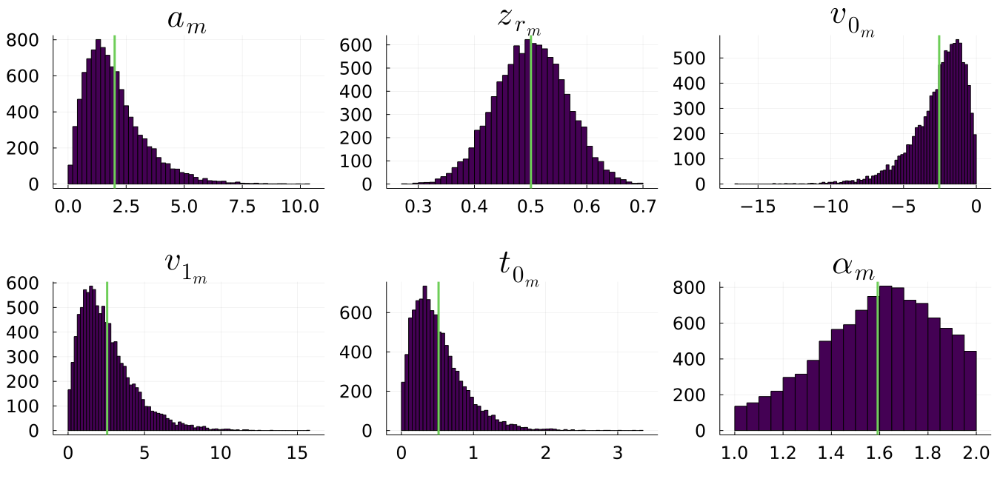

In [8]:
# Plot marginal distribution of group-level priors (marginal \int p(alpha, eta) d eta)
params = ["\$a_m\$" "\$z_{r_m}\$" "\$v_{0_m}\$" "\$v_{1_m}\$" "\$t_{0_m}\$" "\$\\alpha_m\$"]
histogram(sim_data[:,1:6], layout=6, size=(1350,666), title=params, 
          titlefontsize=30, tickfontsize=16,
          top_margin=3mm, bottom_margin=12mm, legend=false, color=:viridis)
vline!(sim_data_means[:,1:6], layout=6, label="", color=viridis[200], linewidth=3)

In [9]:
savefig("pp_hierarchicalgroup_marginal.pdf")

#### Distribution of group-means 

In [10]:
# Simulate and summarize multiple datasets
n_sims_datasets = 10000
n_sims_persons = 100
number_params = 9

sim_data = fill(0.0, (n_sims_datasets, n_sims_persons, number_params))

for d in 1:n_sims_datasets
    hyperpriors = generate_levy_hyperpriors()
    for i in 1:n_sims_persons
        sim_data[d, i, :] = generate_levy_priors(hyperpriors...)
    end
end

sim_data_means_per_dataset = mean(sim_data, dims=2)[:,1,:]
sim_data_means = mean(sim_data, dims=1:2)[1,:,:]
sim_data_sds = std(sim_data, dims=1:2)[1,:,:];

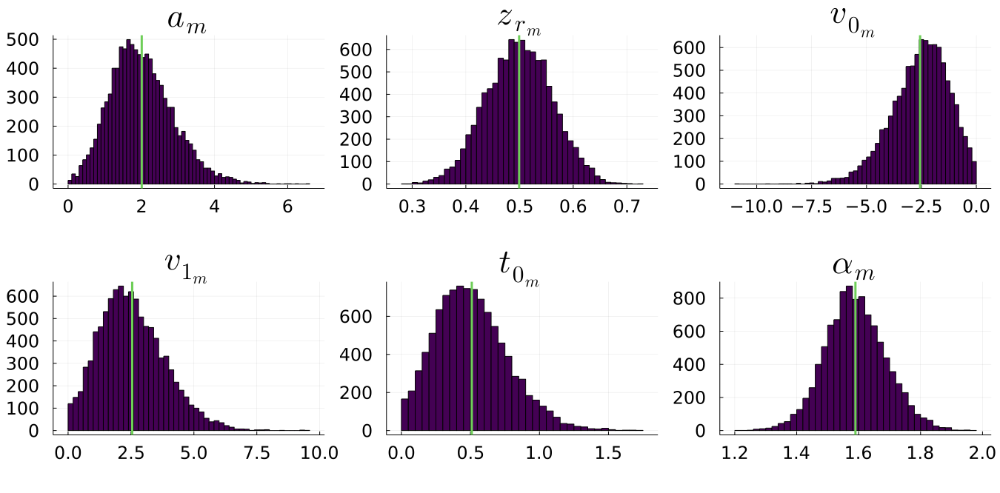

In [11]:
# Plot dataset means of hierarchical priors (mean[p(theta|eta)])
params = ["\$a_m\$" "\$z_{r_m}\$" "\$v_{0_m}\$" "\$v_{1_m}\$" "\$t_{0_m}\$" "\$\\alpha_m\$"]
histogram(sim_data_means_per_dataset[:,1:6], layout=6, size=(1350,666), title=params, 
          titlefontsize=30, tickfontsize=16,
          top_margin=3mm, bottom_margin=12mm, legend=false, color=:viridis)
vline!(sim_data_means[:,1:6], layout=6, label="", color=viridis[200], linewidth=3)

In [12]:
savefig("pp_hierarchicalgroup_means.pdf")

### Non-hierarchical group-level priors

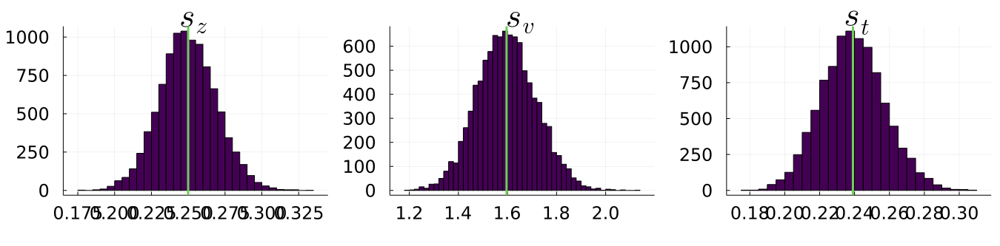

In [13]:
# Plot non-hierarchical priors (p(theta))
h = histogram(sim_data_means_per_dataset[:,7:end], layout=(1,3), size=(1350,333), title=["\$s_z\$" "\$s_v\$" "\$s_t\$"], 
          titlefontsize=30, tickfontsize=16,
          top_margin=3mm, bottom_margin=12mm, legend=false, color=:viridis)
vline!(sim_data_means[:,7:end], layout=6, label="", color=viridis[200], linewidth=3)

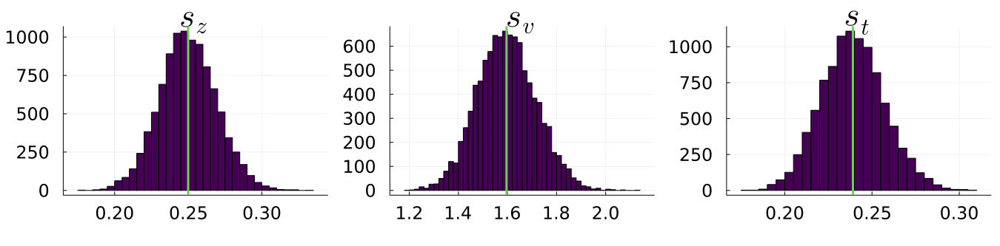

In [16]:
# Version with non-overlapping ticks
h1 = histogram(sim_data_means_per_dataset[:,7], title=["\$s_z\$" ""], titlefontsize=30, tickfontsize=16, top_margin=3mm, bottom_margin=12mm, legend=false, color=:viridis, xticks=[0.20, 0.25, 0.30])
h2 = histogram(sim_data_means_per_dataset[:,8], title=["\$s_v\$" ""], titlefontsize=30, tickfontsize=16, top_margin=3mm, bottom_margin=12mm, legend=false, color=:viridis)
h3 = histogram(sim_data_means_per_dataset[:,9], title=["\$s_t\$" ""], titlefontsize=30, tickfontsize=16, top_margin=3mm, bottom_margin=12mm, legend=false, color=:viridis, xticks=[0.20, 0.25, 0.30])
plot(h1, h2, h3, layout = (1, 3), size=(1350,333))
vline!(sim_data_means[:,7:end], layout=6, label="", color=viridis[200], linewidth=3)

In [17]:
savefig("pp_nonhierarchicalgroup.pdf")

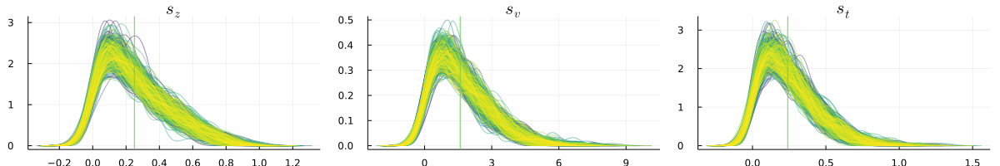

In [180]:
# Plot non hierarchical intertrial variabilities by overlaying the distributions per dataset (p(theta|eta))
# Only for first 500 datasets to keep computation times reasonable
dens_plot = density(sim_data[1,:,7:end], layout=(1,3), size=(1200,200),title=["\$s_z\$" "\$s_v\$" "\$s_t\$"], legend=false)
for d in 2:500
    density!(sim_data[d,:,7:end], layout=(1,3), size=(1200,200), color=get(viridis, d/500), alpha=0.5)
end
vline!(sim_data_means[:,7:end], layout=(1,3), label="", color=viridis[200])
display(dens_plot)

In [13]:
# Full overlaying plots of the distributions per dataset (p(theta|eta))
# Ressource intensive but can deliver additional insights

#dens_plot = density(sim_data[1,:,:], layout=number_params, size=(1200,400),title=["a_l" "zr_l" "v0_l" "v1_l" "t0_l" "alpha_l" "sz" "sv" "st"], legend=false)
#for d in 2:n_sims_datasets
#    density!(sim_data[d,:,:], layout=number_params, size=(1200,400))
#end
#vline!(sim_data_means[1,:,:], layout=number_params, label="")
#println("a_l zr_l v0_l v1_l t0_l alpha_l sz sv st")
#println(sim_data_means[1,:,:])
#println(sim_data_sds[1,:,:])
#display(dens_plot)

In [14]:
# Full overlaying plots of the distributions per dataset (p(theta|eta))
# Ressource intensive but can deliver additional insights

#dens_plot = histogram(sim_data[1,:,:], layout=number_params, size=(1200,400),title=["a_l" "zr_l" "v0_l" "v1_l" "t0_l" "alpha_l" "sz" "sv" "st"], legend=false, alpha=0.2)
#for d in 2:n_sims_datasets
#    histogram!(sim_data[d,:,:], layout=number_params, size=(1200,400), alpha=0.2)
#end
#vline!(sim_data_means[1,:,:], layout=number_params, label="")
#display(dens_plot)